# Walkthrough the SPARCSpy Ecosystem

This notebook will introduce you to the SPARCSpy ecosystem and give you a complete working example of how to use SPARCSpy.

The data used in this notebook was previously stitched using the stitching workflow in [SPARCStools](https://github.com/MannLabs/SPARCStools). Please see the notebook [here](https://mannlabs.github.io/SPARCStools/html/pages/notebooks/example_stitching_notebook.html).

## Import Required Libraries

First we need to import all of the python functions we require to run the pipeline.

In [40]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import pandas as pd

from sparcscore.pipeline.project import TimecourseProject, Project
from sparcscore.pipeline.workflows import MultithreadedWGATimecourseSegmentation, WGATimecourseSegmentation, MultithreadedCytosolCellposeTimecourseSegmentation, ShardedWGASegmentation, ShardedDAPISegmentationCellpose, WGASegmentation, DAPISegmentationCellpose
from sparcscore.pipeline.extraction import HDF5CellExtraction, TimecourseHDF5CellExtraction
from sparcscore.pipeline.classification import MLClusterClassifier
from sparcscore.pipeline.selection import LMDSelection

## Generate the Project Structure

Executing this code will generate a new SPARCSpy project in the designated location. Each SPARCSpy project has the following general structure:

                .
                ├── classification
                │   └── classifier_name
                │       └── processing.log
                ├── config.yml
                ├── extraction
                ├── segmentation
                └── processing.log

In [41]:
project_location = f"../../../example_data/example_1/project"

project = Project(os.path.abspath(project_location),
                  config_path= "config_test.yml",
                  overwrite=False,
                  debug=True,
                  segmentation_f=WGASegmentation,
                  extraction_f=HDF5CellExtraction,
                  classification_f=MLClusterClassifier,
                  selection_f=LMDSelection
                  )

modifying config
[01/06/2023 14:49:33] Loading config from /Users/sophia/Documents/GitHub/SPARCSpy/example_data/example_1/project/config.yml
[01/06/2023 14:49:33] current run: 0


/Users/sophia/Documents/GitHub/SPARCSpy/src/sparcscore/pipeline/project.py:108: UserWarning: Theres already a directory in the location path
  warnings.warn("Theres already a directory in the location path")


## Load Imaging Data

Once we have generated our project structure we next need to load our imaging data. There are several different ways to do this. 

1. you can load the images directly from file by specifying a list of filepaths
2. you can load the images from numpy arrays that are already loaded into memory

Here it is important that you load the channels in the following order: Nucleus, Cellmembrane, others

### Method 1: loading images from file

In [42]:
images = ["../../../example_data/example_1/stitched_images/stitching_test_DAPI.tif",
          "../../../example_data/example_1/stitched_images/stitching_test_Alexa488.tif",
          "../../../example_data/example_1/stitched_images/stitching_test_mCherry.tif"]

project.load_input_from_file(images)

(3, 3039, 3037)


### Method 2: loading images from numpy array

In [43]:
from tifffile import imread

images = ["../../../example_data/example_1/stitched_images/stitching_test_DAPI.tif",
          "../../../example_data/example_1/stitched_images/stitching_test_Alexa488.tif",
          "../../../example_data/example_1/stitched_images/stitching_test_mCherry.tif"]

image_arrays = np.array([imread(path) for path in images])

project.load_input_from_array(image_arrays)

### Looking at the loaded images

The loaded images are accesible via the input_image parameter of the project and are saved as numpy arrays with the following structure (c, x, y)

In [44]:
project.input_image

array([[[0.000e+00, 0.000e+00, 0.000e+00, ..., 2.393e+03, 2.404e+03,
         0.000e+00],
        [0.000e+00, 1.494e+03, 1.253e+03, ..., 2.349e+03, 2.209e+03,
         0.000e+00],
        [0.000e+00, 1.343e+03, 1.449e+03, ..., 2.593e+03, 2.386e+03,
         0.000e+00],
        ...,
        [0.000e+00, 4.092e+03, 4.057e+03, ..., 2.300e+02, 2.170e+02,
         0.000e+00],
        [0.000e+00, 4.620e+03, 4.303e+03, ..., 2.540e+02, 2.190e+02,
         0.000e+00],
        [0.000e+00, 0.000e+00, 0.000e+00, ..., 0.000e+00, 0.000e+00,
         0.000e+00]],

       [[0.000e+00, 0.000e+00, 0.000e+00, ..., 8.720e+02, 6.590e+02,
         0.000e+00],
        [0.000e+00, 3.100e+02, 4.560e+02, ..., 5.950e+02, 2.730e+02,
         0.000e+00],
        [0.000e+00, 4.710e+02, 3.120e+02, ..., 6.360e+02, 4.410e+02,
         0.000e+00],
        ...,
        [0.000e+00, 9.950e+02, 9.030e+02, ..., 1.089e+03, 1.293e+03,
         0.000e+00],
        [0.000e+00, 9.890e+02, 8.530e+02, ..., 1.369e+03, 1.586e+03,
   

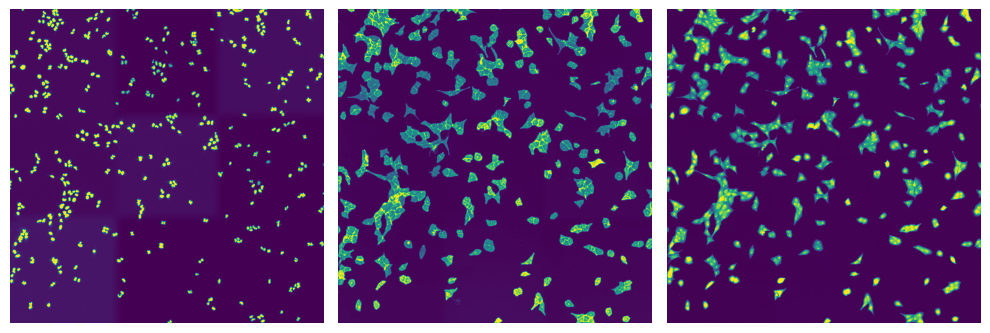

In [45]:
# visualize input images as example
# it is not recommended to execute this block with large input images as it will compute for some time

fig, axs = plt.subplots(1, 3, figsize = (10, 4));
axs[0].imshow(project.input_image[0]);
axs[0].axis("off");

axs[1].imshow(project.input_image[1]);
axs[1].axis("off");

axs[2].imshow(project.input_image[2]);
axs[2].axis("off");

fig.tight_layout()

## Generating a Segmentation

SPARCSpy has different segmentation workflows between which you can choose. If none of them fit your needs you can also easily write your own. 

Here we will demonstrate the CPU based classical segmentation method that was also utilized in the manuscript. 

We define the segmentation method to be used when we initialize the project. In this case we used the `WGASegmentation` method. The `ShardedWGASegmentation` works very similarily but allows you to process several image chunks in parallel for more efficient computation on large input images.

By specifying `debug = True` we can see intermediate output results from the segmentation. 

The `WGASegmentation` method relies on parameters specified in the `config.yml` we loaded when initializing our project.

                WGASegmentation:
                    input_channels: 3
                    chunk_size: 50 # chunk size for chunked HDF5 storage
                    lower_quantile_normalization:   0.001
                    upper_quantile_normalization:   0.999
                    median_filter_size:   4 # Size in pixels
                    nucleus_segmentation:
                        lower_quantile_normalization:   0.01 
                        upper_quantile_normalization:   0.99 
                        median_block: 41 
                        median_step: 4
                        threshold: 0.2 
                        min_distance: 8 
                        peak_footprint: 7 
                        speckle_kernel: 9 
                        dilation: 0 # final dilation of pixel mask       
                        min_size: 200 # minimum nucleus area in pixel
                        max_size: 5000 # maximum nucleus area in pixel
                        contact_filter: 0.5 # minimum nucleus contact with background
                    wga_segmentation:
                        threshold: 0.05 
                        lower_quantile_normalization: 0.01
                        upper_quantile_normalization: 0.99
                        erosion: 2 
                        dilation: 7 
                        min_clip: 0
                        max_clip: 0.2
                        min_size: 200
                        max_size: 30000
                    chunk_size: 50

[01/06/2023 14:49:35] No existing map 0 normalized found at path /Users/sophia/Documents/GitHub/SPARCSpy/example_data/example_1/project/segmentation/0_normalized_map.npy, new one will be created
[01/06/2023 14:49:35] No existing map 1 median found at path /Users/sophia/Documents/GitHub/SPARCSpy/example_data/example_1/project/segmentation/1_median_map.npy, new one will be created
[01/06/2023 14:49:35] No existing map 2 nucleus_segmentation found at path /Users/sophia/Documents/GitHub/SPARCSpy/example_data/example_1/project/segmentation/2_nucleus_segmentation_map.npy, new one will be created
[01/06/2023 14:49:35] No existing map 3 nucleus_mask found at path /Users/sophia/Documents/GitHub/SPARCSpy/example_data/example_1/project/segmentation/3_nucleus_mask_map.npy, new one will be created
[01/06/2023 14:49:35] No existing map 4 wga_mask found at path /Users/sophia/Documents/GitHub/SPARCSpy/example_data/example_1/project/segmentation/4_wga_mask_map.npy, new one will be created
[01/06/2023 1

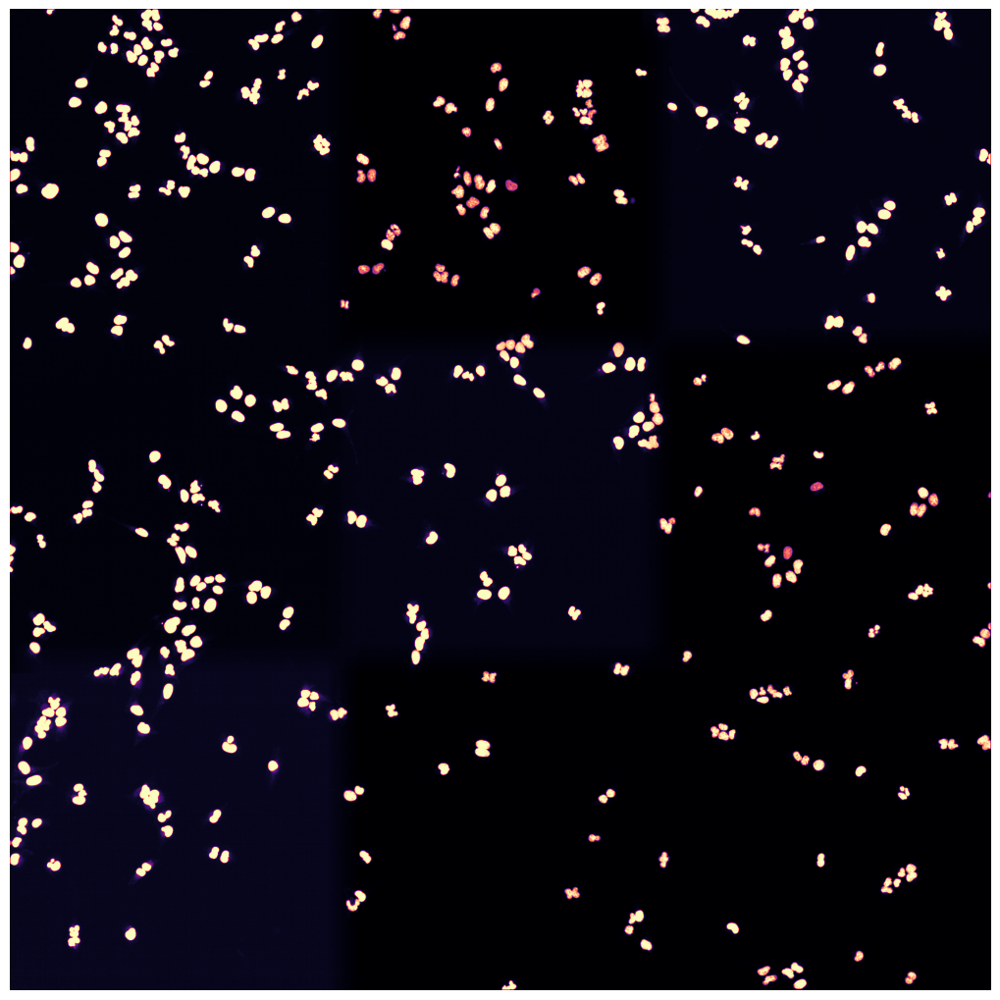

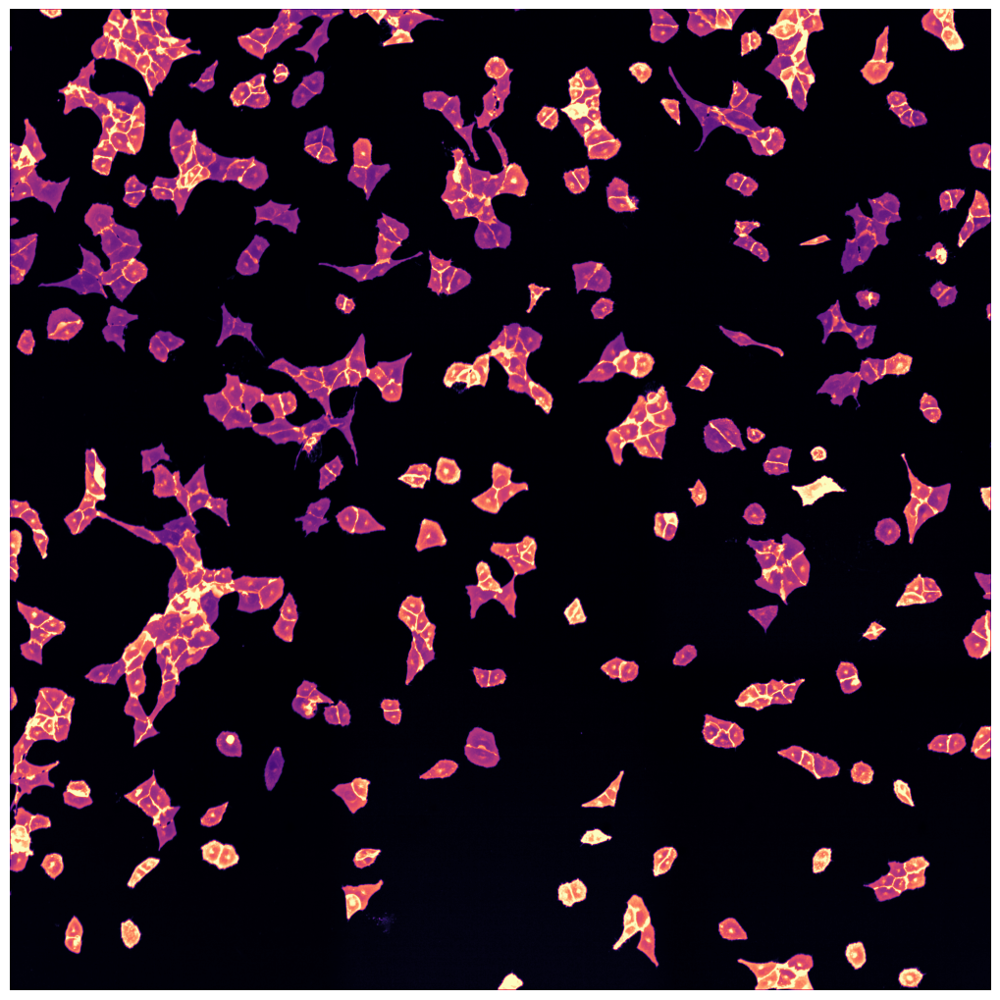

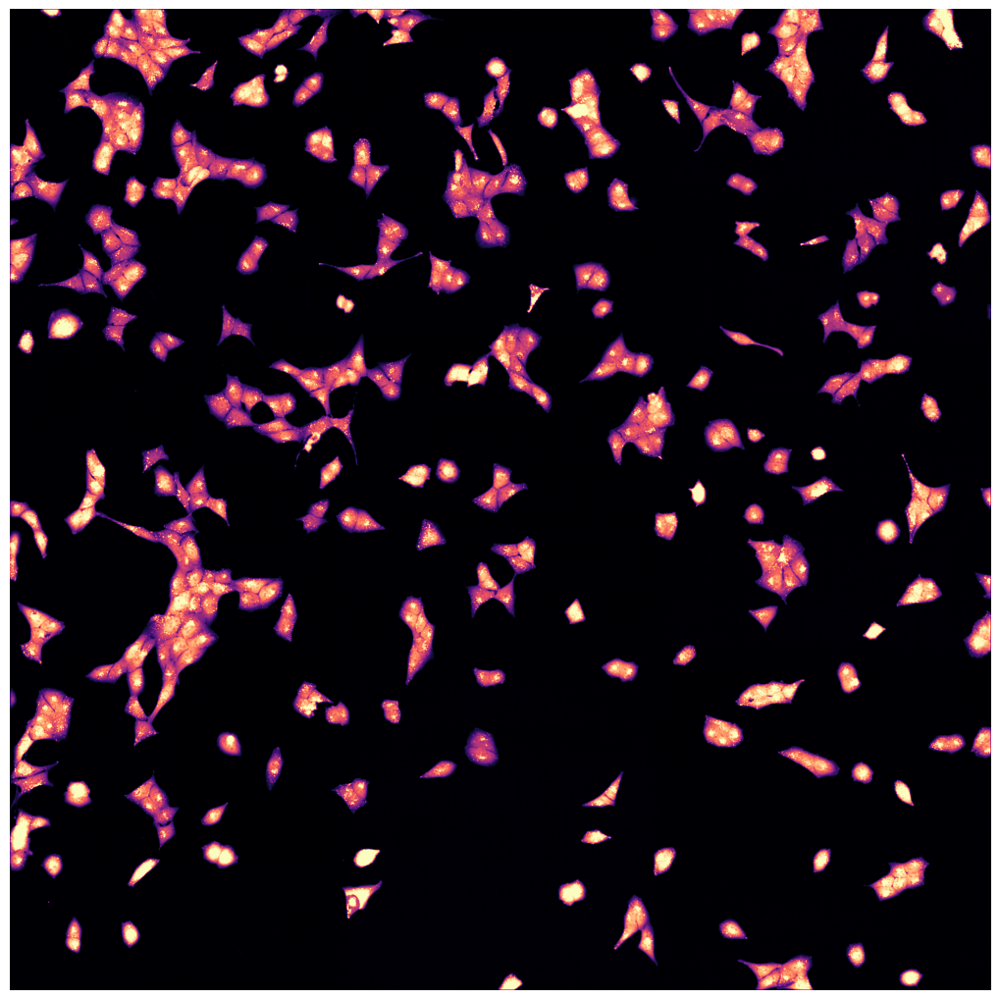

[01/06/2023 14:49:38] Normalized map created
[01/06/2023 14:49:38] Started with median map


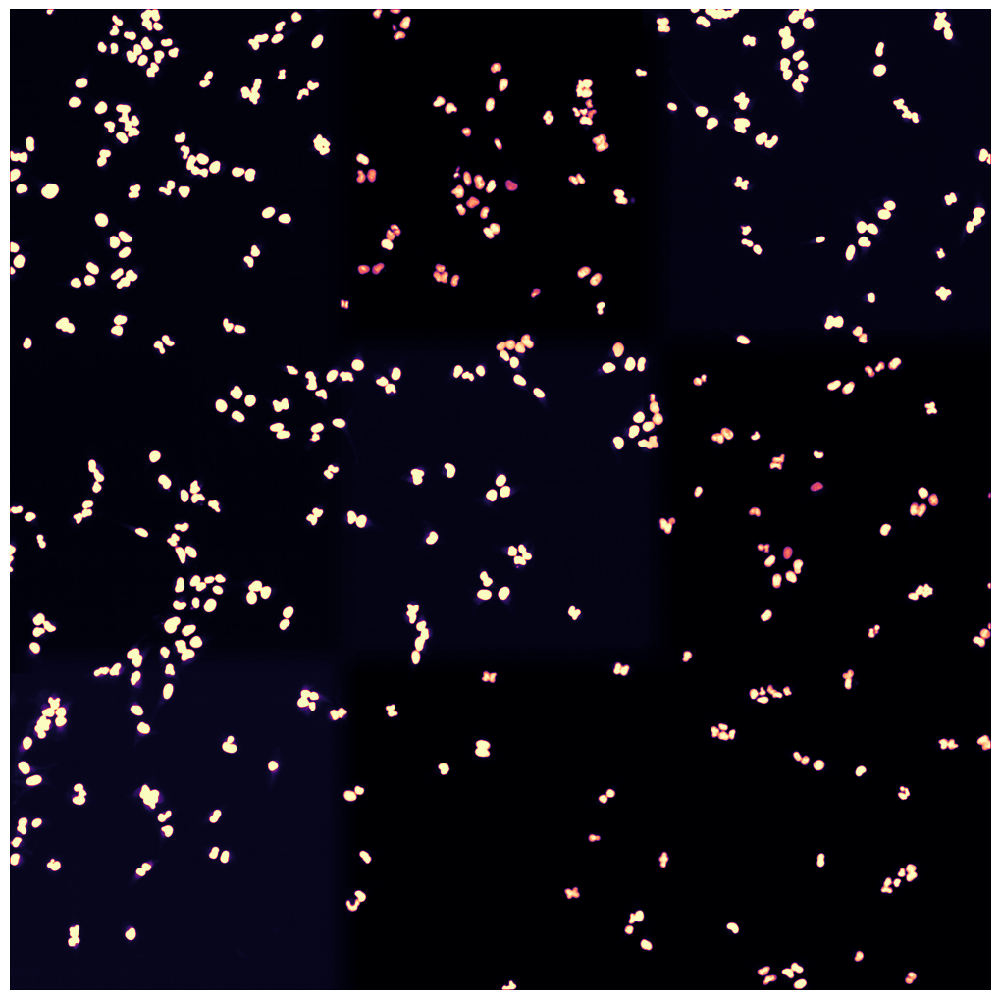

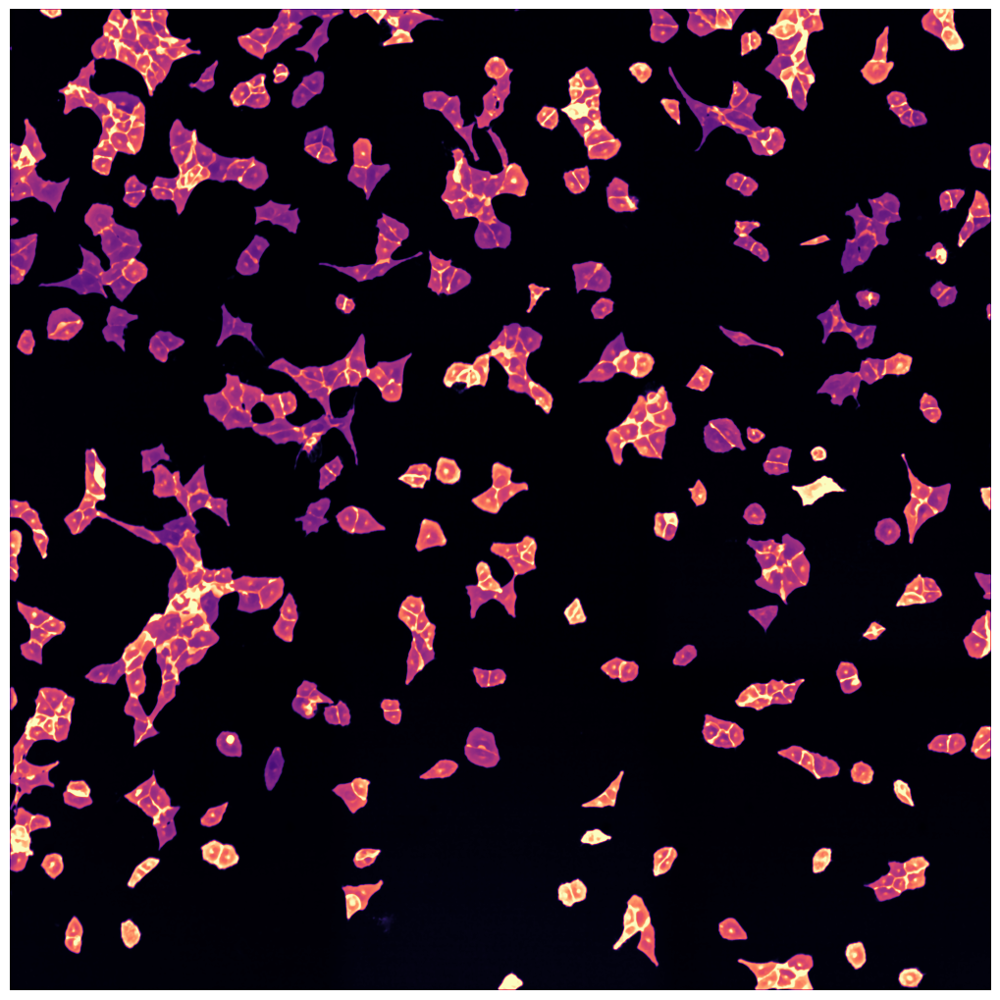

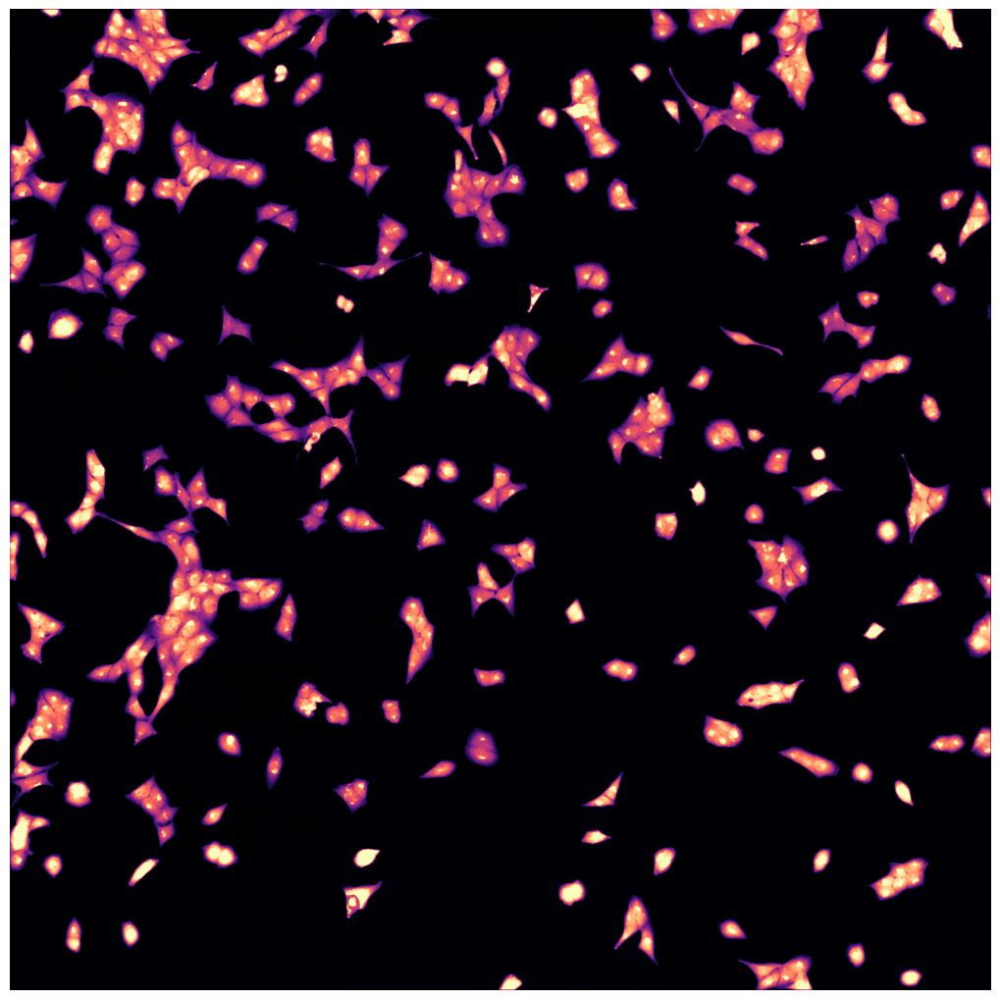

[01/06/2023 14:49:55] Median map created


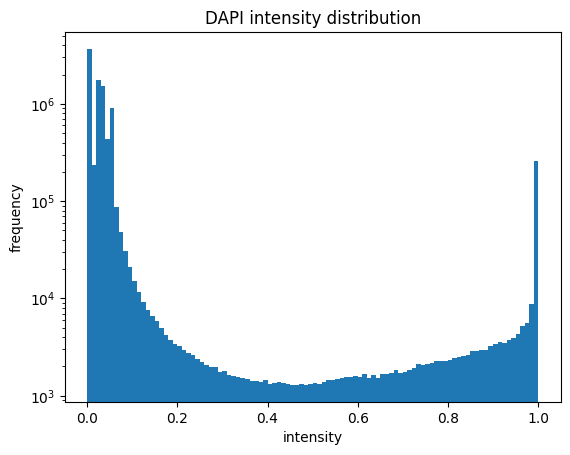

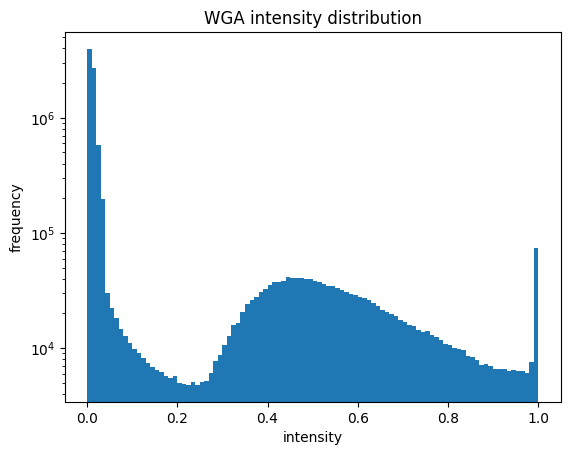

[01/06/2023 14:49:56] Started performing nucleus segmentation.
[01/06/2023 14:49:56] Generating thresholded nucleus map.


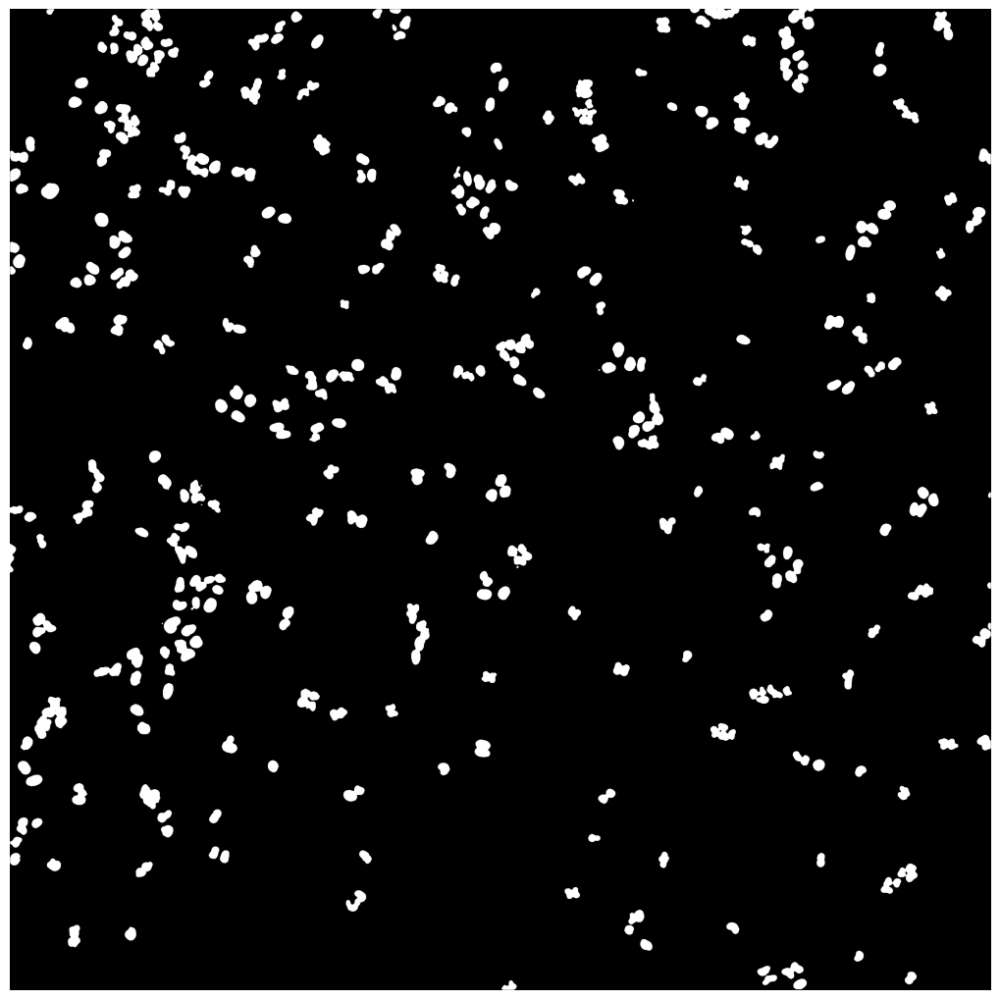

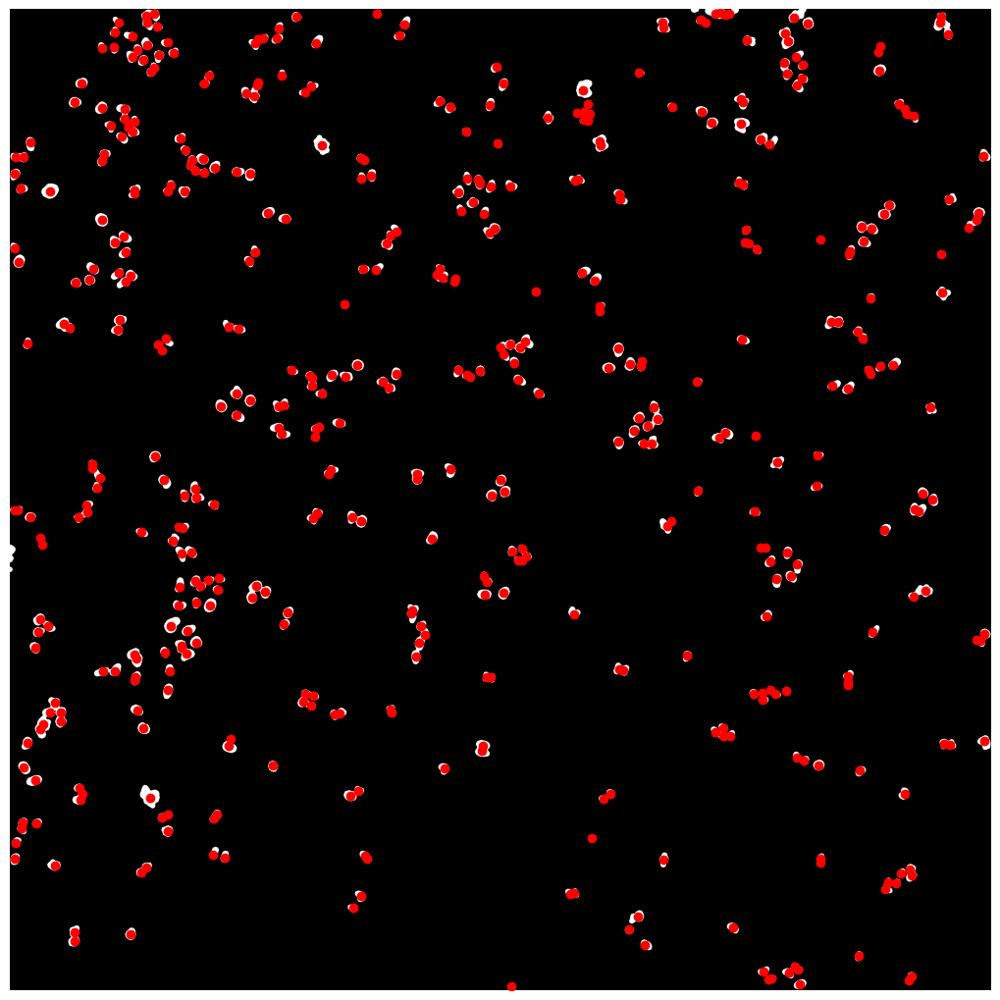

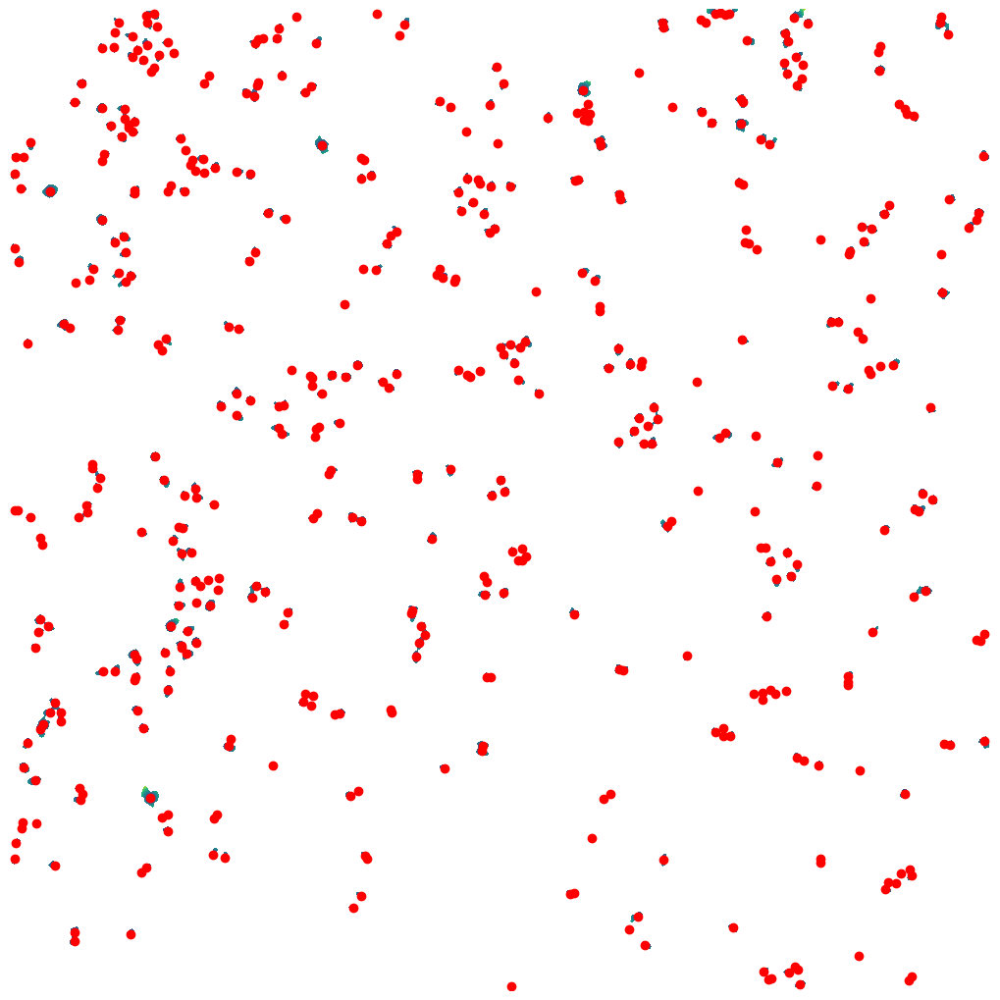

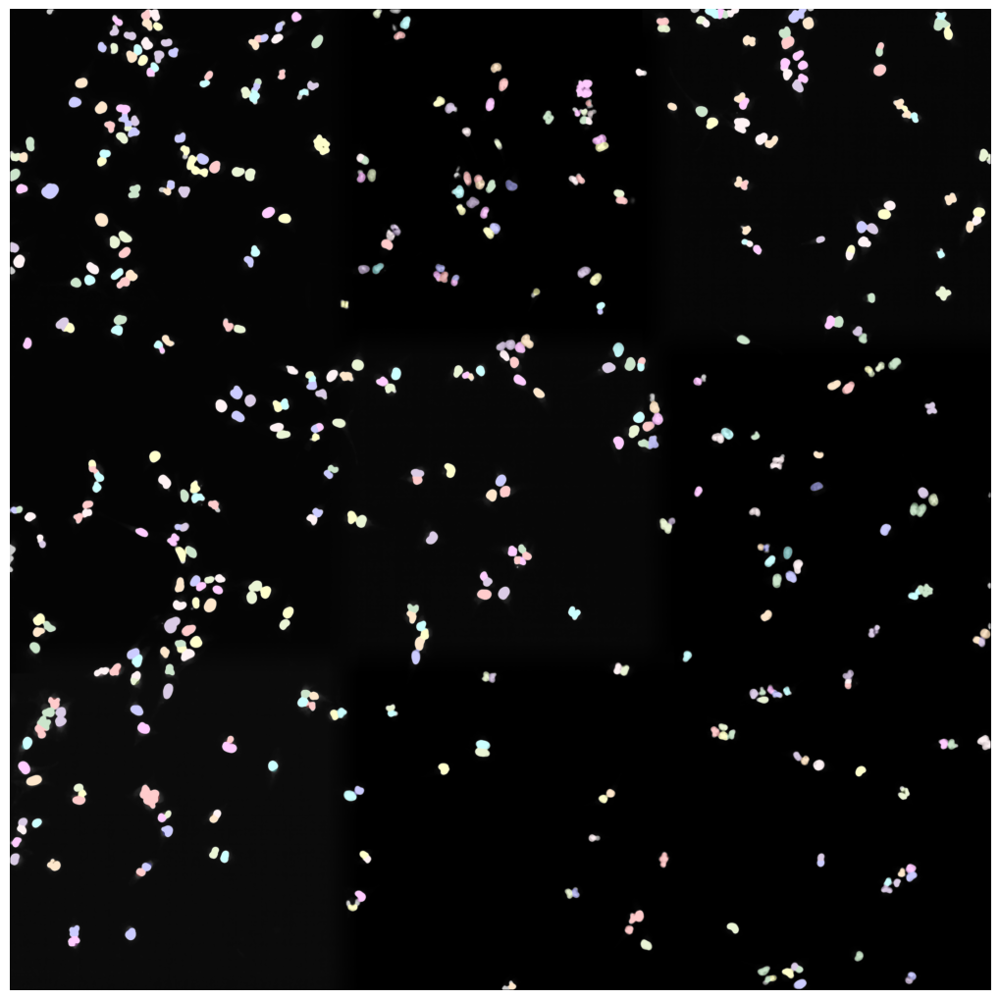

[01/06/2023 14:50:12] /Users/sophia/Documents/GitHub/SPARCSpy/example_data/example_1/project/segmentation/2_nucleus_segmentation_map will be saved as tif


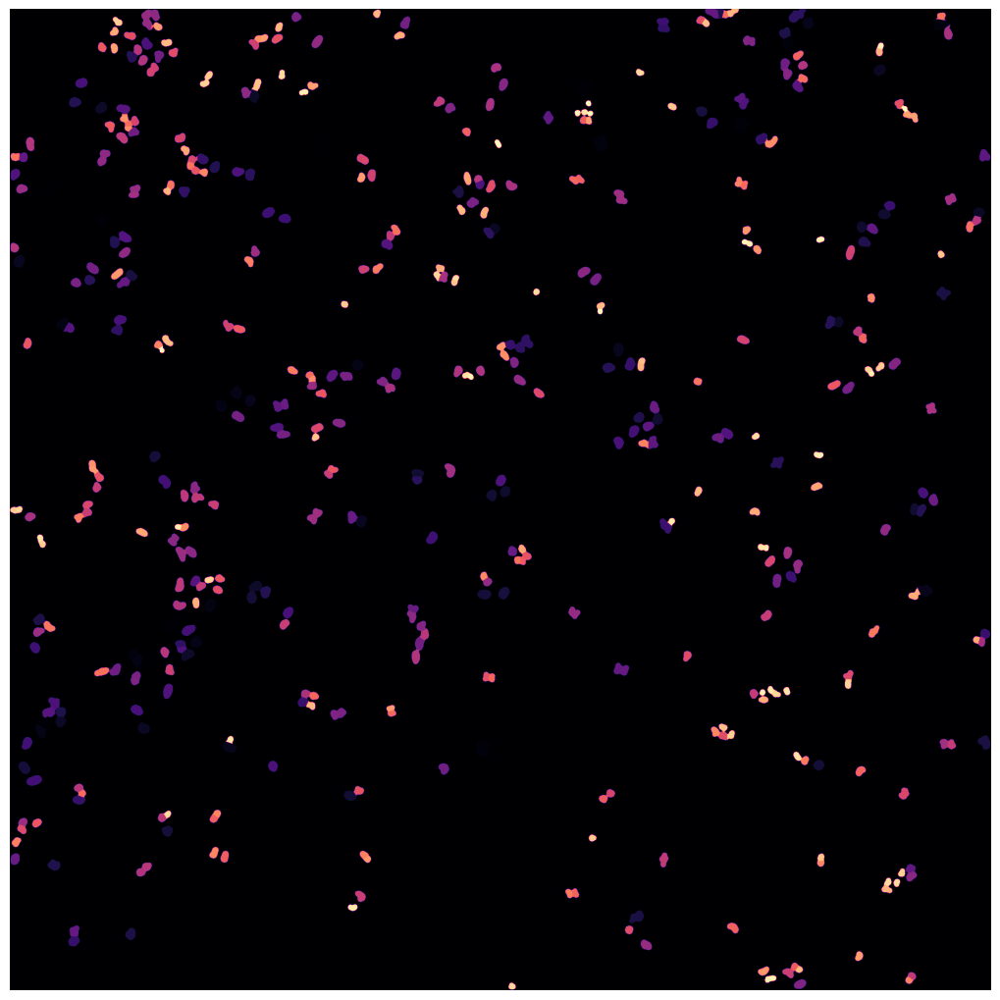

[01/06/2023 14:50:12] Thresholded nucleus map created.
[01/06/2023 14:50:12] Started with nucleus mask map
[01/06/2023 14:50:12] /Users/sophia/Documents/GitHub/SPARCSpy/example_data/example_1/project/segmentation/3_nucleus_mask_map will be saved as tif


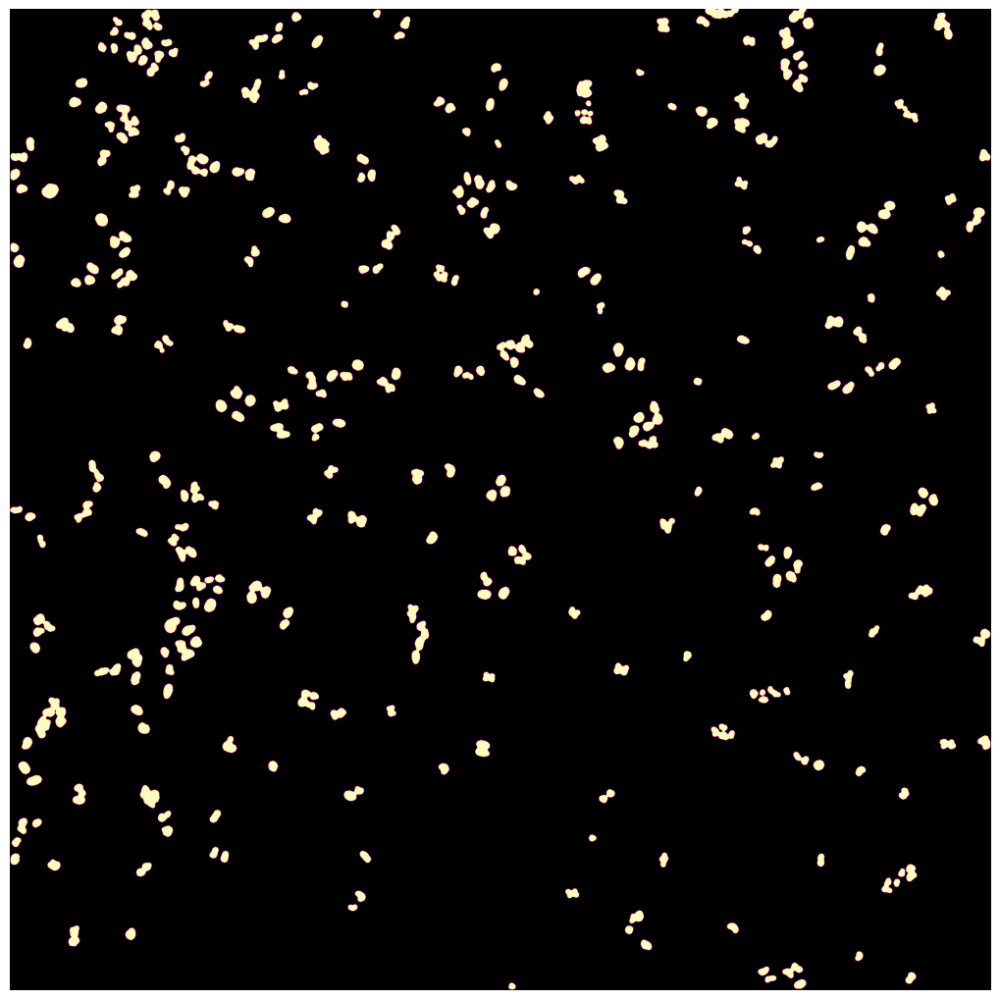

[01/06/2023 14:50:13] Nucleus mask map created with 494 elements
[01/06/2023 14:50:13] Filtered out due to contact limit: 10 
[01/06/2023 14:50:14] Filtered out due to size limit: 0 
[01/06/2023 14:50:14] Filtered out: 10 


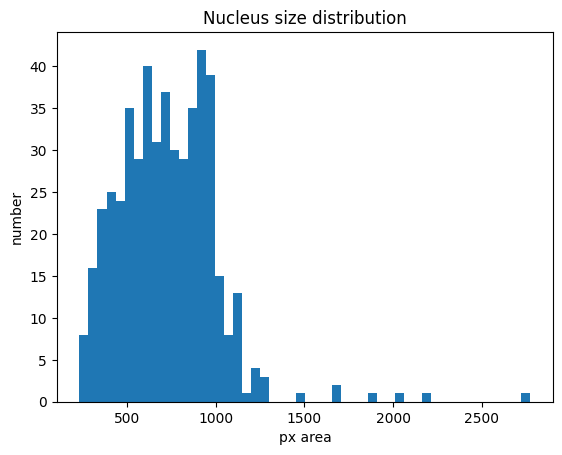

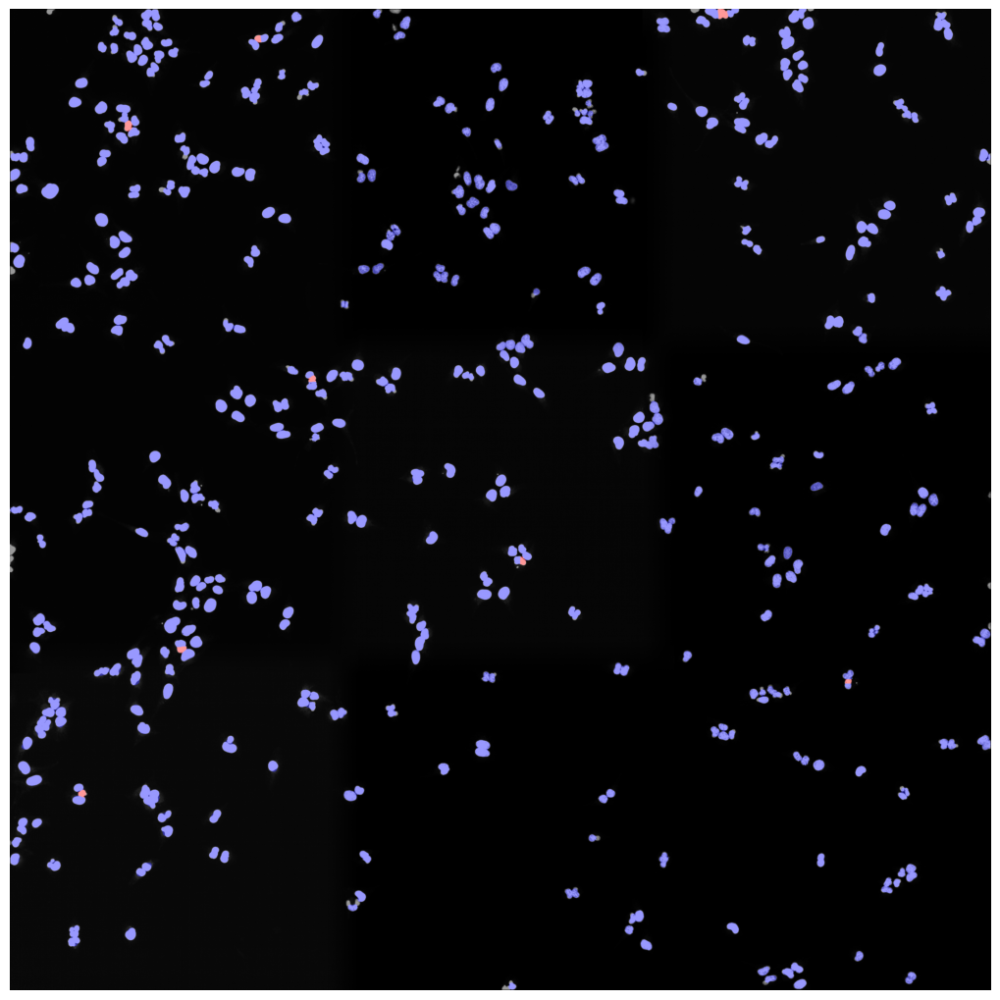

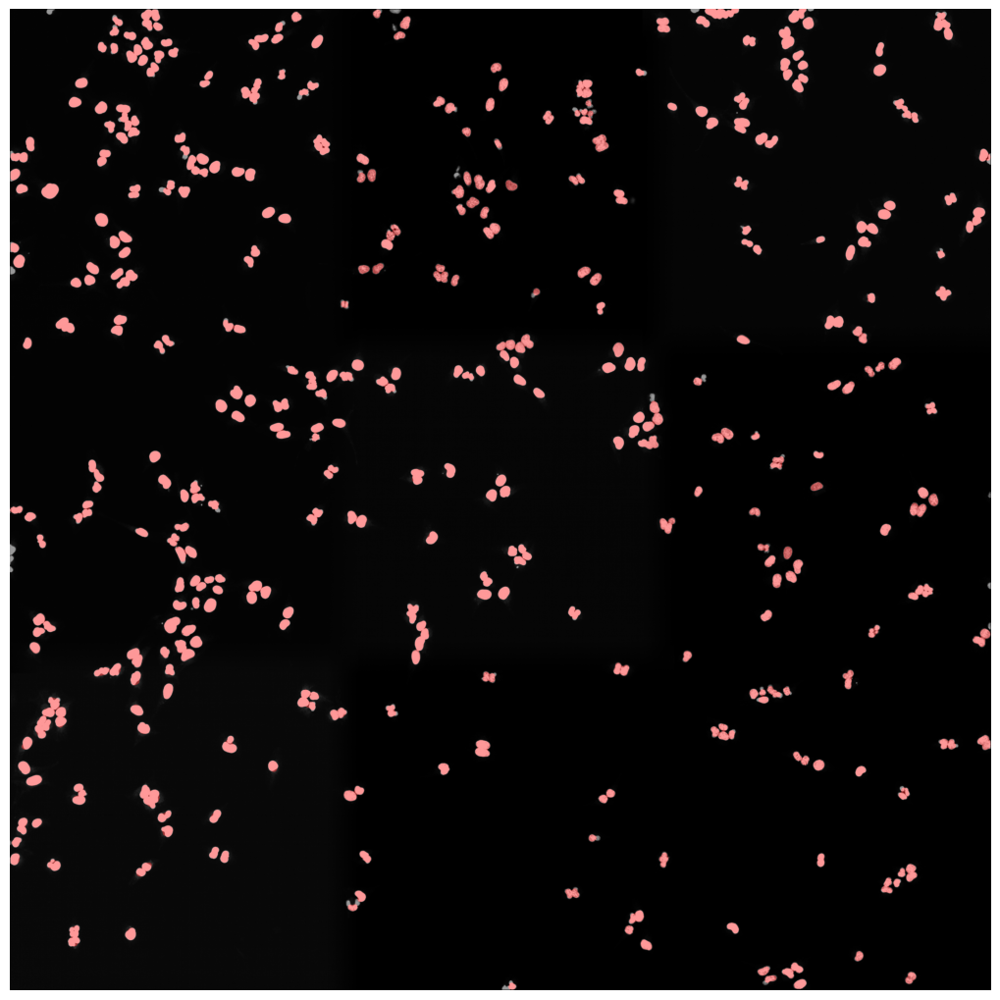

[01/06/2023 14:50:16] Started with WGA mask map


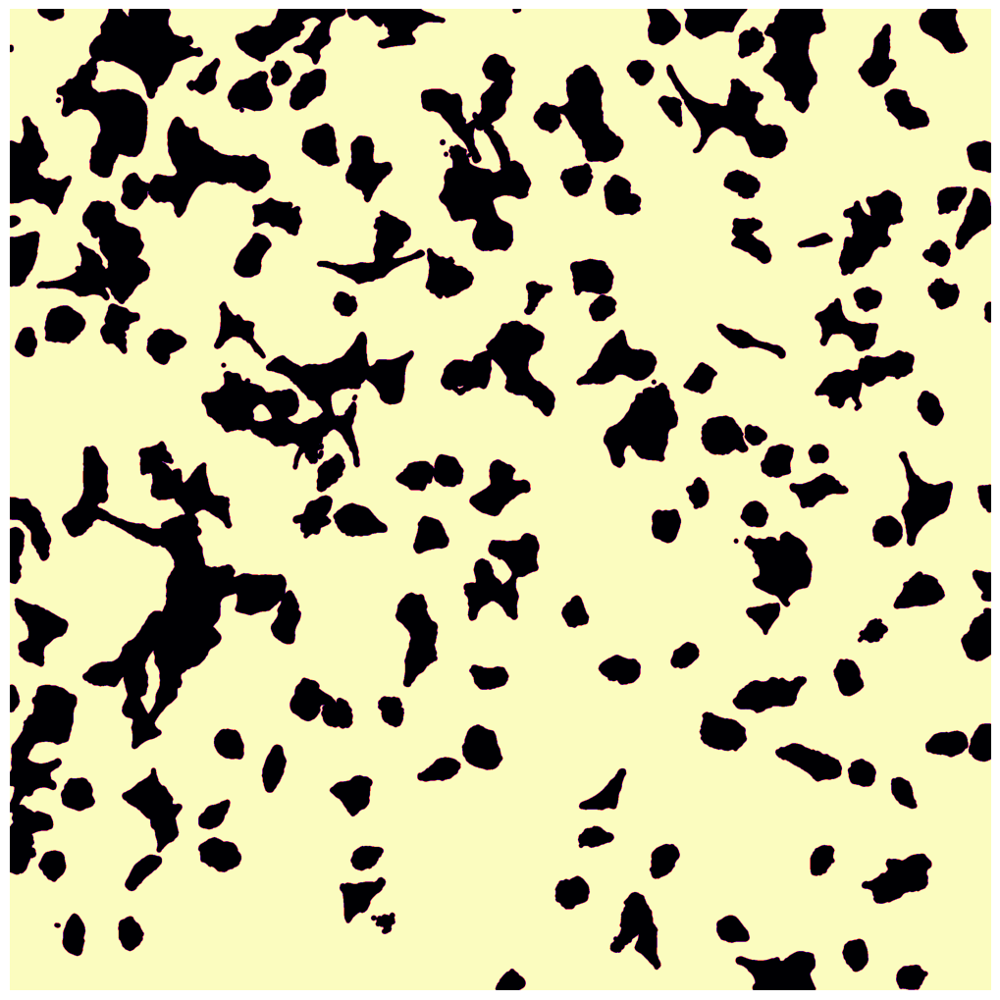

[01/06/2023 14:50:18] WGA mask map created
[01/06/2023 14:50:18] Started with WGA potential map


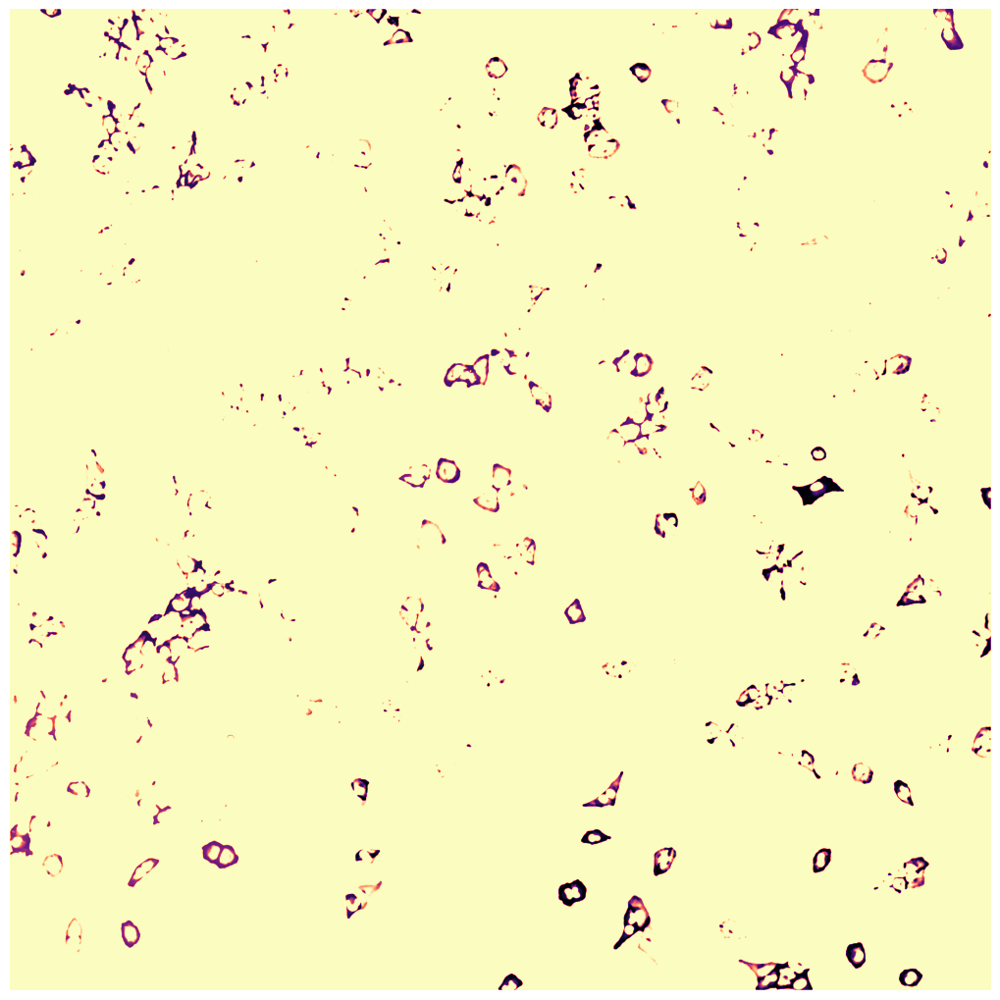

[01/06/2023 14:50:19] WGA mask potential created
[01/06/2023 14:50:19] Started with fast marching


/Users/sophia/Documents/GitHub/SPARCSpy/src/sparcscore/pipeline/workflows.py:191: RuntimeWarning: invalid value encountered in cast
  px_center = np.round(center_nuclei).astype(int)


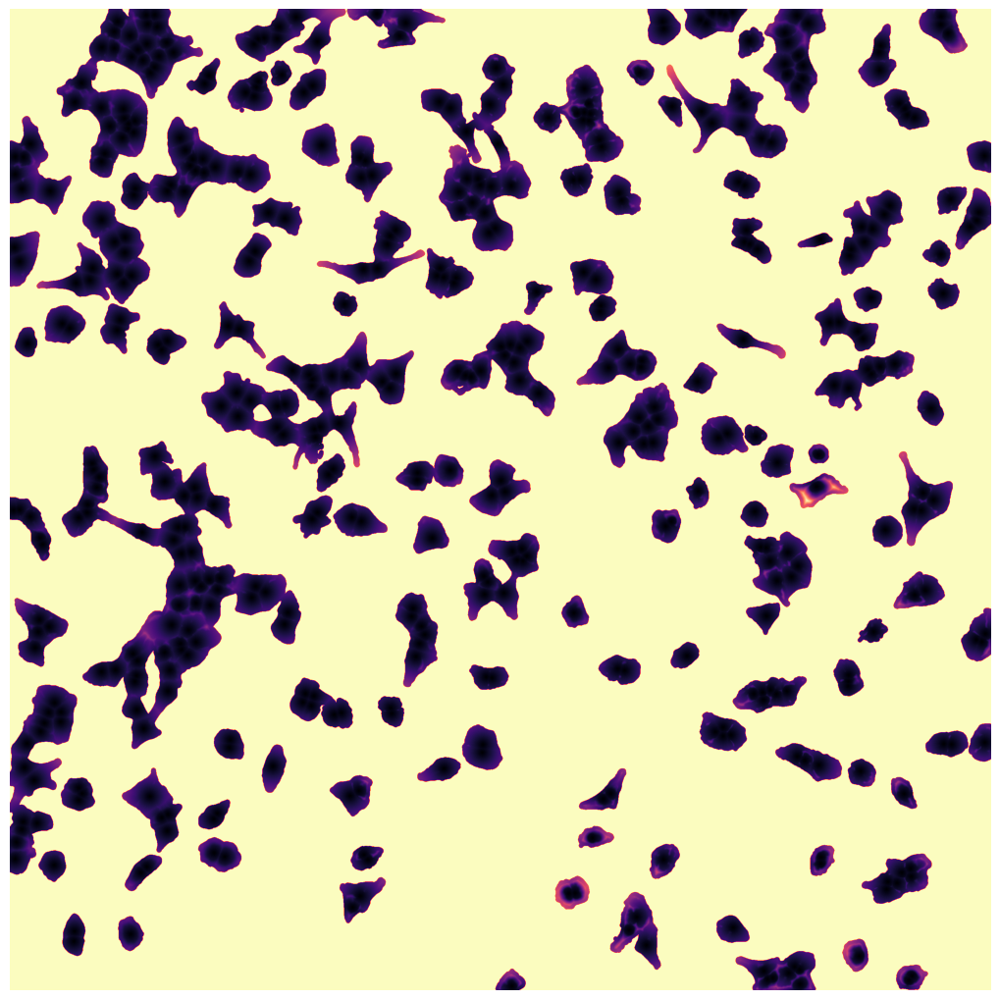

[01/06/2023 14:50:21] Fast marching finished
[01/06/2023 14:50:21] Started with watershed


/Users/sophia/Documents/GitHub/SPARCSpy/src/sparcscore/pipeline/workflows.py:213: RuntimeWarning: invalid value encountered in cast
  px_center = np.round(center_nuclei).astype(int)


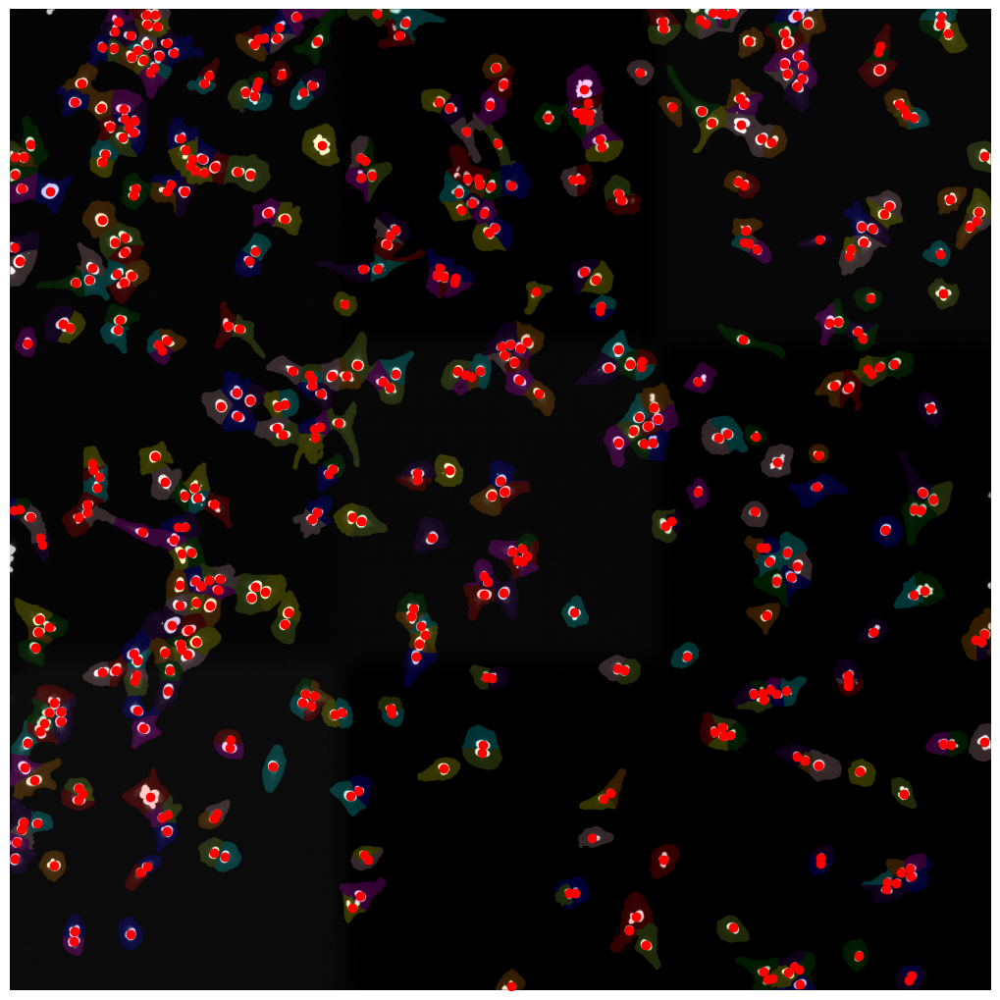

[01/06/2023 14:50:23] /Users/sophia/Documents/GitHub/SPARCSpy/example_data/example_1/project/segmentation/7_watershed_map will be saved as tif


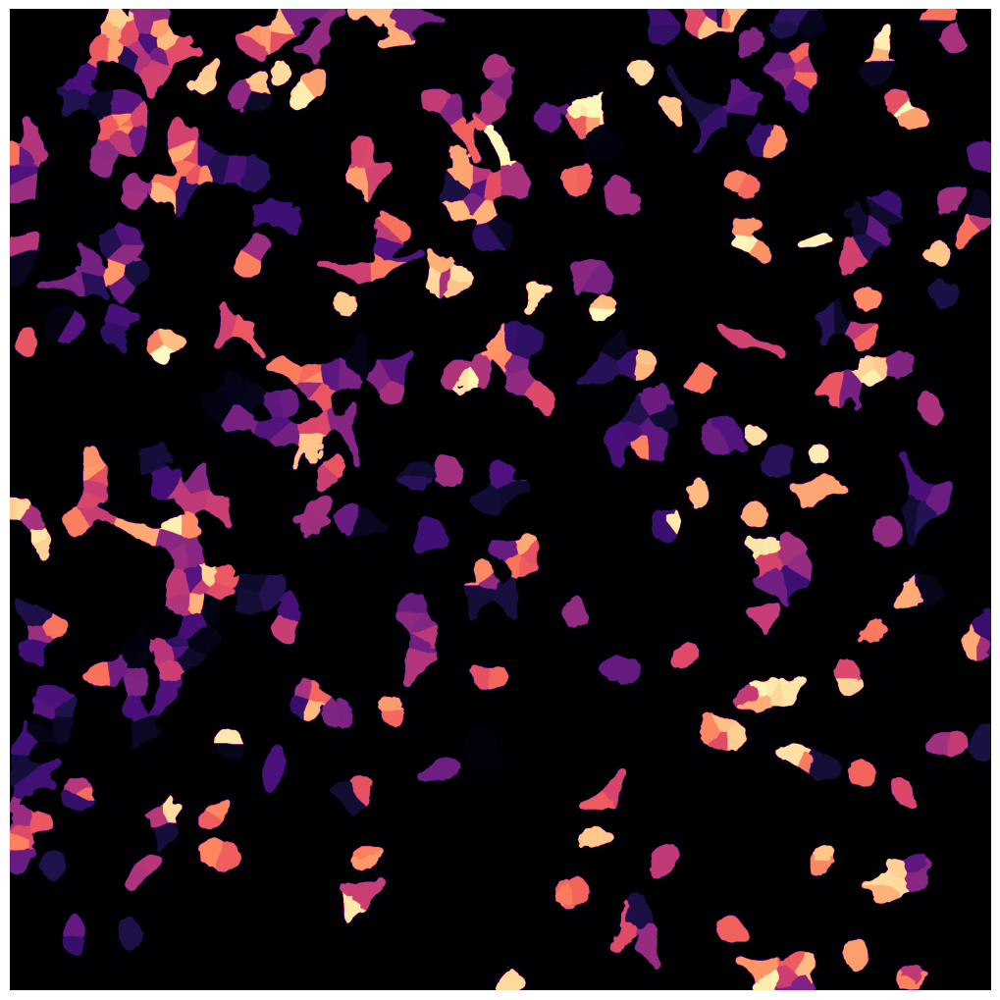

[01/06/2023 14:50:23] watershed finished
[01/06/2023 14:50:24] Cells filtered out due to cytosol size limit: 0 
[01/06/2023 14:50:24] Filtered out: 10 
[01/06/2023 14:50:24] Remaining: 485 


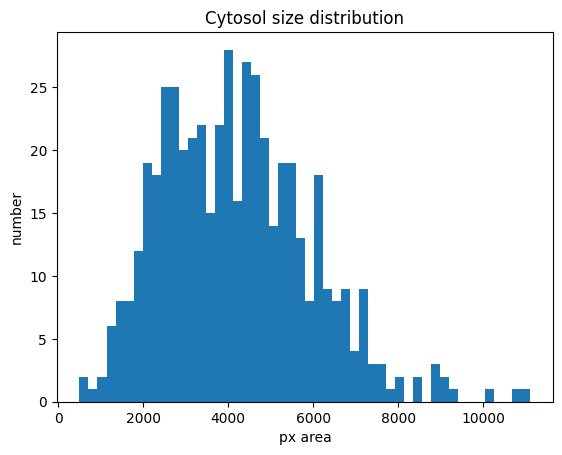

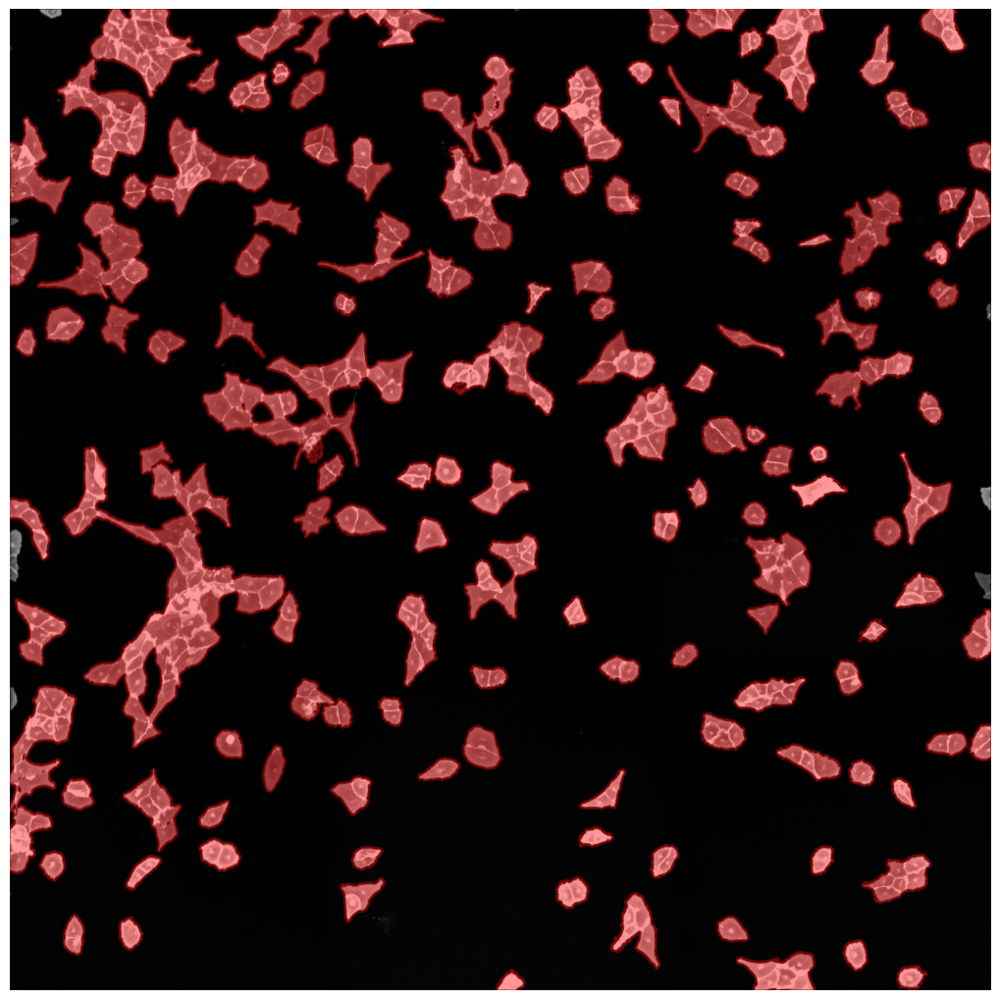

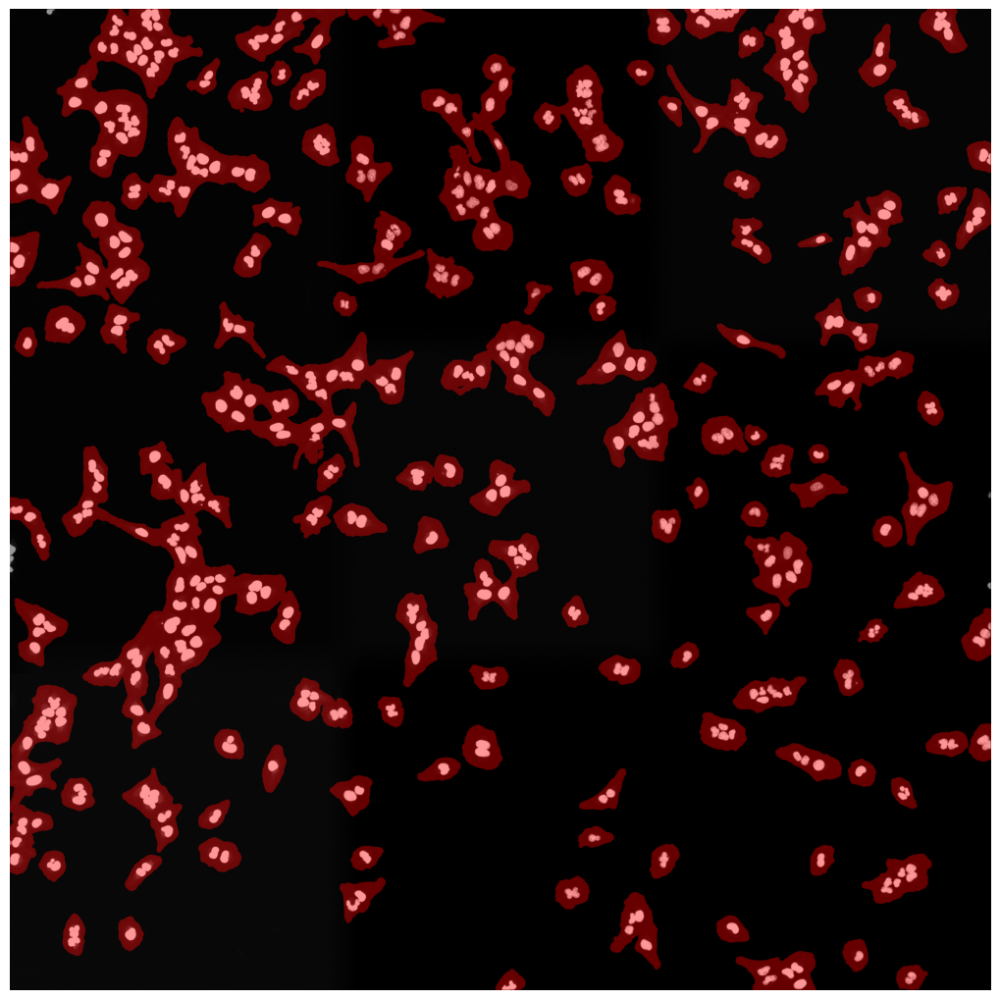

[01/06/2023 14:50:27] saving segmentation
[01/06/2023 14:50:27] === finished segmentation ===


In [46]:
project.segment(debug = True)

### Looking at Segmentation Results

The Segmentation Results are written to a hdf5 file called `segmentation.h5` located in the segmentation directory of our SPARCSpy project.

The file contains two datasets: `channels` and `labels`. Channels contains the input images and `labels` the generated segmentation masks.

In [47]:
import h5py

with h5py.File(f"{project_location}/segmentation/segmentation.h5") as hf:
    print(hf.keys())


<KeysViewHDF5 ['channels', 'labels']>


If we look at the `labels` dataset we can see that it contains a numpy array containing two segmentation masks: the nuclear segmentation and the cytosol segmentation generated by our chosen segmentation method.

<HDF5 dataset "labels": shape (2, 3040, 3038), type "<i4">


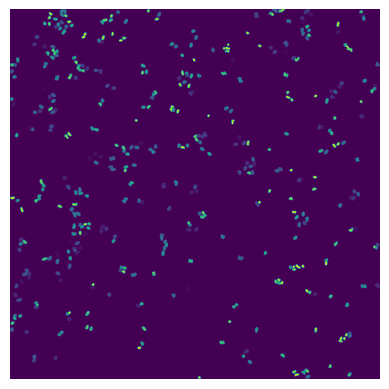

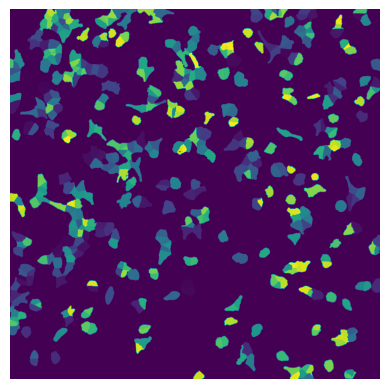

In [48]:
with h5py.File(f"{project_location}/segmentation/segmentation.h5") as hf:
    segmentation = hf.get("labels")
    print(segmentation)

    plt.figure()
    plt.imshow(segmentation[0])
    plt.axis("off")

    plt.figure()
    plt.imshow(segmentation[1])
    plt.axis("off")


Each segmentation mask is an array where each pixel is assigned either to background (`0`) or to a specific cell (`cellid: whole number`).

If we zoom in on the corner of the segmentation mask of a nucleus the numpy array would look like this:

[[  0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0 205]
 [  0   0   0   0   0   0   0 205 205 205]
 [  0   0   0   0   0   0 205 205 205 205]
 [  0   0   0   0 205 205 205 205 205 205]
 [  0   0   0 205 205 205 205 205 205 205]
 [  0   0 205 205 205 205 205 205 205 205]
 [  0 205 205 205 205 205 205 205 205 205]
 [205 205 205 205 205 205 205 205 205 205]]


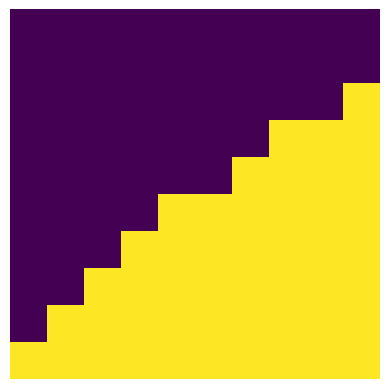

In [49]:
with h5py.File(f"{project_location}/segmentation/segmentation.h5") as hf:
    segmentation = hf.get("labels")

    plt.imshow(segmentation[0, 80:90, 945:955])
    plt.axis("off")
    print(segmentation[0, 80:90, 945:955])


## Extracting single-cell images

Once we have generated a segmentation mask, the next step is to extract single-cell images of segmented cells in the dataset.

Like during the segmentation there are several extraction methods to choose from. For regular SPARCSpy projects we need the `HDF5CellExtraction` method. This will extract single-cell images for all cells segmentated in the dataset and write them to a hdf5 file.

The parameters with which `HDF5CellExtraction` will run are again specified in the `config.yml` file.

                HDF5CellExtraction:
                    compression: True
                    threads: 80 # threads used in multithreading
                    image_size: 128 # image size in pixel
                    cache: "."
                    hdf5_rdcc_nbytes: 5242880000 # 5gb 1024 * 1024 * 5000 
                    hdf5_rdcc_w0: 1
                    hdf5_rdcc_nslots: 50000

In [50]:
project.extract()

[01/06/2023 14:50:28] Using channel label <HDF5 dataset "channels": shape (3, 3040, 3038), type "<f8">
[01/06/2023 14:50:28] Using segmentation label <HDF5 dataset "labels": shape (2, 3040, 3038), type "<i4">
[01/06/2023 14:50:28] Created new extraction cache ./1baf6da4-ccb6-46ec-bd51-5118a414bfa9
[01/06/2023 14:50:28] Started extraction
[01/06/2023 14:50:28] Loading segmentation data from {input_segmentation_path}
[01/06/2023 14:50:28] Using channel label <HDF5 dataset "channels": shape (3, 3040, 3038), type "<f8">
[01/06/2023 14:50:28] Using segmentation label <HDF5 dataset "labels": shape (2, 3040, 3038), type "<i4">
[01/06/2023 14:50:28] Finished loading channel data (3, 3040, 3038)
[01/06/2023 14:50:28] Finished loading label data (2, 3040, 3038)
[01/06/2023 14:50:28] Checked class coordinates
[01/06/2023 14:50:28] Cached version found, loading
[01/06/2023 14:50:28] Loading filtered classes from /Users/sophia/Documents/GitHub/SPARCSpy/example_data/example_1/project/segmentation/cl

extracting classes: 16it [00:00, 157.74it/s]

[01/06/2023 14:50:28] Extracting dataset 0


extracting classes: 122it [00:00, 160.05it/s]

[01/06/2023 14:50:29] Extracting dataset 100


extracting classes: 234it [00:01, 177.51it/s]

[01/06/2023 14:50:29] Extracting dataset 200


extracting classes: 328it [00:01, 169.79it/s]

[01/06/2023 14:50:30] Extracting dataset 300


extracting classes: 422it [00:02, 180.15it/s]

[01/06/2023 14:50:30] Extracting dataset 400


extracting classes: 484it [00:02, 172.14it/s]


[01/06/2023 14:50:31] Finished extraction in 2.81 seconds (172.07 cells / second)
[01/06/2023 14:50:31] Collect cells
[01/06/2023 14:50:31] number of cells too close to image edges to extract: 52
[01/06/2023 14:50:31] Transferring extracted single cells to .hdf5
[01/06/2023 14:50:31] index created.
[01/06/2023 14:50:32] Tempmmap Folder location /var/folders/35/p4c58_4n3bb0bxnzgns1t7kh0000gn/T/./temp_mmap24gm079o will now be removed.
[01/06/2023 14:50:32] Finished cleaning up cache


### Look at extracted single-cell images

The extracted single-cell images are written to a h5py file `single_cells.h5` located under `extraction\data` within the project folder.

The file contains two datasets: `single_cell_data` and `single_cell_index`. `single_cell_data` contains the extracted single cell images while `single_cell_index` contains the cell id of the extracted cell at that location.

In [51]:
import h5py

with h5py.File(f"{project_location}/extraction/data/single_cells.h5") as hf:
    print(hf.keys())


<KeysViewHDF5 ['single_cell_data', 'single_cell_index']>


So if we want to look at the first cell in the dataset we can first check which cellid was assigned to this cell by looking at the 10th entry in the `single_cell_index` dataset and then get the extracted single-cell images from the `single_cell_data` dataset.

The extracted single-cell images represent the following information in this order:  
<ol>
1. nucleus mask<br>
                2. cytosol mask  <br>
                3. nucleus channel <br> 
                4. cytosol channel <br> 
                5. other channels<br>
</ol> 

cell id:  [10 11]


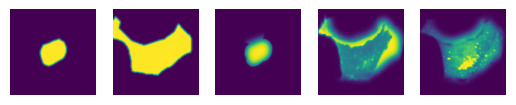

In [52]:
with h5py.File(f"{project_location}/extraction/data/single_cells.h5") as hf:
    index = hf.get("single_cell_index")
    images = hf.get("single_cell_data")

    print("cell id: ", index[10])

    image = images[10]

    fig, axs = plt.subplots(1, 5)

    for i, _img in enumerate(image):
        axs[i].imshow(_img)
        axs[i].axis("off")

## Classification of extracted single-cells

Next we can apply a pretained model to classify our cells within the SPARCSpy project. 

Within the `config.yml` we specify which model should be used for inference and we can give it a name. 

                MLClusterClassifier:
                    channel_classification: 4
                    threads: 24 #
                    batch_size: 900
                    dataloader_worker: 0 #needs to be 0 if using cpu
                    standard_scale: False
                    exp_transform: False
                    log_transform: False
                    network: "autophagy_classifier2.1"
                    classifier_architecture: "VGG2_old"
                    screen_label: "Autophagy_15h_classifier2.1"
                    epoch: "max"
                    encoders: ["forward"]
                    inference_device: "cpu"

Here e.g. we are using a pretrained model included within the SPARCSpy library `autophagy_classifier2.1` and are naming the results from this model `Autophagy_15h_classifier2.1`. 

The inference results will be written to a new folder generated under `classification` with this name. 

If we want to use a model we trained ourselves that is not yet included within the SPARCSpy library we can simply replace the network name in the config with the path to the checkpoint file generated by pytorch.

In [53]:
accessory = ([], [], [])
project.classify(accessory = accessory)

Lightning automatically upgraded your loaded checkpoint from v1.5.5 to v2.0.2. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file ../../../src/pretrained_models/autophagy/autophagy2.2/VGG2_autophagy_classifier2_2.cpkt`


[01/06/2023 14:50:32] Started classification
[01/06/2023 14:50:32] starting with run 0
[01/06/2023 14:50:32] channel_classification: 4
[01/06/2023 14:50:32] threads: 24
[01/06/2023 14:50:32] batch_size: 900
[01/06/2023 14:50:32] dataloader_worker: 0
[01/06/2023 14:50:32] standard_scale: False
[01/06/2023 14:50:32] exp_transform: False
[01/06/2023 14:50:32] log_transform: False
[01/06/2023 14:50:32] pca_dimensions: 0
[01/06/2023 14:50:32] umap_neighbours: 30
[01/06/2023 14:50:32] umap_min_dist: 0.001
[01/06/2023 14:50:32] network: autophagy_classifier2.2
[01/06/2023 14:50:32] classifier_architecture: VGG2_old
[01/06/2023 14:50:32] screen_label: Autophagy_15h_classifier2.1
[01/06/2023 14:50:32] epoch: max
[01/06/2023 14:50:32] encoders: ['forward']
[01/06/2023 14:50:32] inference_device: cpu
[01/06/2023 14:50:32] 0 different accessory datasets specified
[01/06/2023 14:50:32] model parameters loaded from autophagy_classifier2.2
[01/06/2023 14:50:32] loading /Users/sophia/Documents/GitHub/

### looking at the generated results

The results are written to a csv file which we can load with pandas.

SPARCSpy writes the softmax results directly to csv as `ln()` for better precision. To transform these numbers back to the range between 0 and 1 we first need to apply the `np.exp` function.

In [54]:
results = pd.read_csv(f"{project_location}/classification/0_Autophagy_15h_classifier2.1/dimension_reduction_forward.tsv", index_col = 0)
results.result_0 = np.exp(results.result_0)
results.result_1 = np.exp(results.result_1)

results

,result_0,result_1,label,cell_id
0,9.229987e-07,0.999999,0,98
1,1.391613e-06,0.999999,0,60
2,2.630094e-05,0.999974,0,3
3,6.641098e-04,0.999336,0,103
4,1.444993e-02,0.985550,0,113
...,...,...,...,...
427,3.525092e-05,0.999965,0,282
428,9.838445e-04,0.999016,0,423
429,6.322246e-06,0.999994,0,203
430,2.172819e-04,0.999783,0,114


Depending on the model we used what `result_0` and `result_1` represent will vary. Here we used a binary classification model were class 1 was cells deficient in autophagy. So `result_1` indicates the probability score that a cell has the label "autophagy off". `results_0` is simply `1 - result_1`

If we look at the distribution in our dataset we can see that almost all cells are classified as "autophagy defective". Since the input images were from unstimulated wt cells this matches to our expectation.

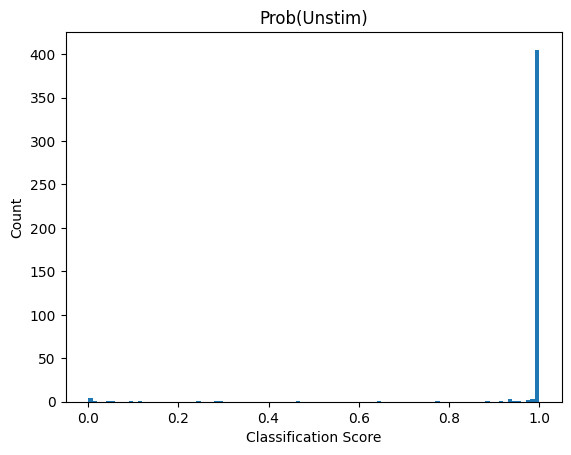

In [55]:
plt.hist(results.result_1, bins = 100);
plt.title("Prob(Unstim)");
plt.xlabel("Classification Score");
plt.ylabel("Count");

## Exporting Cutting countours for excision on the LMD7

SPARCSpy directly interfaces with our other open-source python library [py-lmd](https://github.com/MannLabs/py-lmd) to easily select and export cells for excision on a Leica LMD microscope. 

Of note: this will require that the cells have been plates on a LMD compatible surface (like a PPS slide). SPARCSpy can of course also simply be used for data analysis procedures, then ignore this last step.

First we will select the cells we wish to excise based on their classification score. Here we have chosen a threadhold >= 0.99999 for bin1 and a threshold <= 0.9 for bin2. 

In [56]:
cell_ids_bin1 = results[results.result_1 >= 0.99999].cell_id.tolist()
cell_ids_bin2 = results[results.result_1 <= 0.9].cell_id.tolist()

print("number of cells to excise:",len(cell_ids_bin1) + len(cell_ids_bin2))

number of cells to excise: 271


The cells can then be allocated into different wells.

In [57]:
cells_to_select = [{"name": "bin1", "classes": list(cell_ids_bin1), "well":"A1"},
                   {"name": "bin2", "classes": list(cell_ids_bin2), "well":"B1"},
                   ]

In addition to defining which cells we want to excise, we also need to pass the location of the calibration crosses so that we can transfer the image coordinate system into a cutting coordinate system. You can read up on this [here](https://mannlabs.github.io/py-lmd/html/pages/segmentation_loader.html#different-coordinate-systems).

To obtain the coordinates of your reference points simply open your stitched image in e.g. FIJI and navigate to the location of your reference points. Then write out the coordinates for each point.

In [58]:
marker_0 = (0, 0)
marker_1 = (2000, 0)
marker_2 = (0, 2000)

calibration_marker = np.array([marker_0, marker_1, marker_2])

As with the previous methods, additional parameters can be passed to the selection function via the `config.yml` file which adapts the behaviour of how cutting shapes are generated. You can read up more on this [here](https://mannlabs.github.io/py-lmd/html/pages/segmentation_loader.html#overview-of-configuration).

                LMDSelection:
                    processes: 20

                    # defines the channel used for generating cutting masks
                    # segmentation.hdf5 => labels => segmentation_channel
                    # When using WGA segmentation:
                    #    0 corresponds to nuclear masks
                    #    1 corresponds to cytosolic masks.
                    segmentation_channel: 0

                    # dilation of the cutting mask in pixel
                    shape_dilation: 16

                    # number of datapoints which are averaged for smoothing
                    # the number of datapoints over an distance of n pixel is 2*n
                    smoothing_filter_size: 25

                    # fold reduction of datapoints for compression
                    poly_compression_factor: 30
                    
                    # can be "none", "greedy", or "hilbert"
                    path_optimization: "hilbert"
                    
                    # number of nearest neighbours for optimized greedy search
                    greedy_k: 15
                    
                    # hilbert curve order
                    hilbert_p: 7



[01/06/2023 14:50:37] Selection process started
No configuration for shape_erosion found, parameter will be set to 0
No configuration for binary_smoothing found, parameter will be set to 3
No configuration for convolution_smoothing found, parameter will be set to 15
No configuration for xml_decimal_transform found, parameter will be set to 100
No configuration for distance_heuristic found, parameter will be set to 300
No configuration for join_intersecting found, parameter will be set to True
sanity check for cell set 0
cell set 0 passed sanity check
sanity check for cell set 1
cell set 1 passed sanity check
Convert label format into coordinate format
Conversion finished, sanity check
Check passed
Check passed
Check passed


100%|██████████| 255/255 [00:02<00:00, 115.79it/s]


Create shapes for merged cells


100%|██████████| 106/106 [00:01<00:00, 57.49it/s]


Calculating polygons


100%|██████████| 106/106 [00:03<00:00, 31.44it/s]


Polygon calculation finished
Current path length: 142,403.15 units
Path optimizer defined in config: hilbert
Optimized path length: 142,403.15 units
Optimization factor: 1.0x


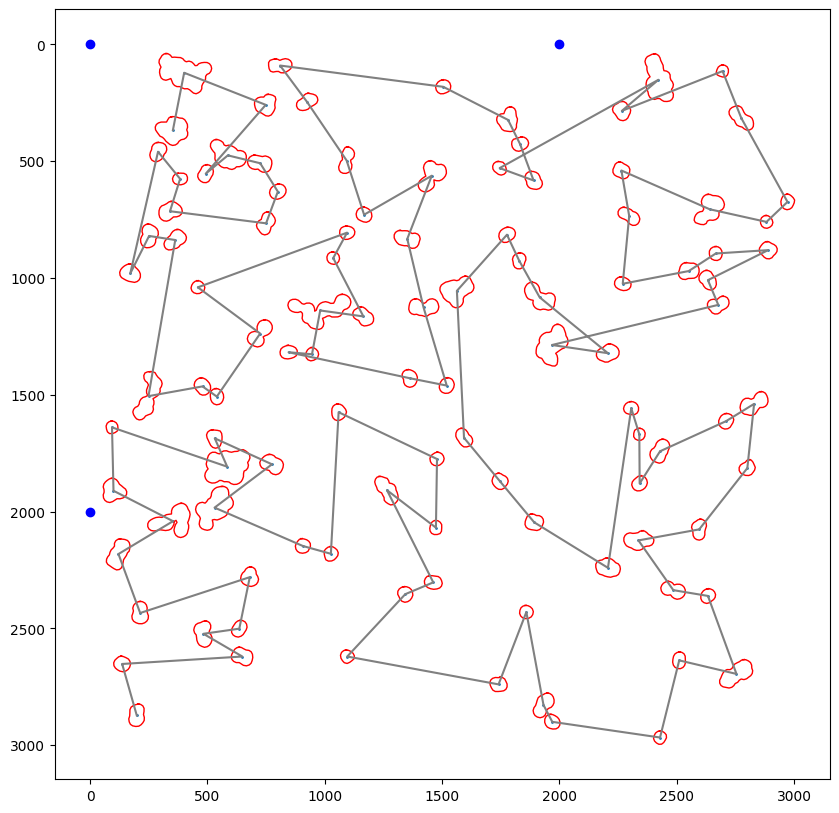

Convert label format into coordinate format
Conversion finished, sanity check
Check passed
Check passed
Check passed


100%|██████████| 16/16 [00:01<00:00, 10.87it/s]

Create shapes for merged cells



100%|██████████| 15/15 [00:01<00:00, 10.66it/s]

Calculating polygons



100%|██████████| 15/15 [00:01<00:00, 10.55it/s]


Polygon calculation finished
Current path length: 17,031.39 units
Path optimizer defined in config: hilbert
Optimized path length: 17,031.39 units
Optimization factor: 1.0x


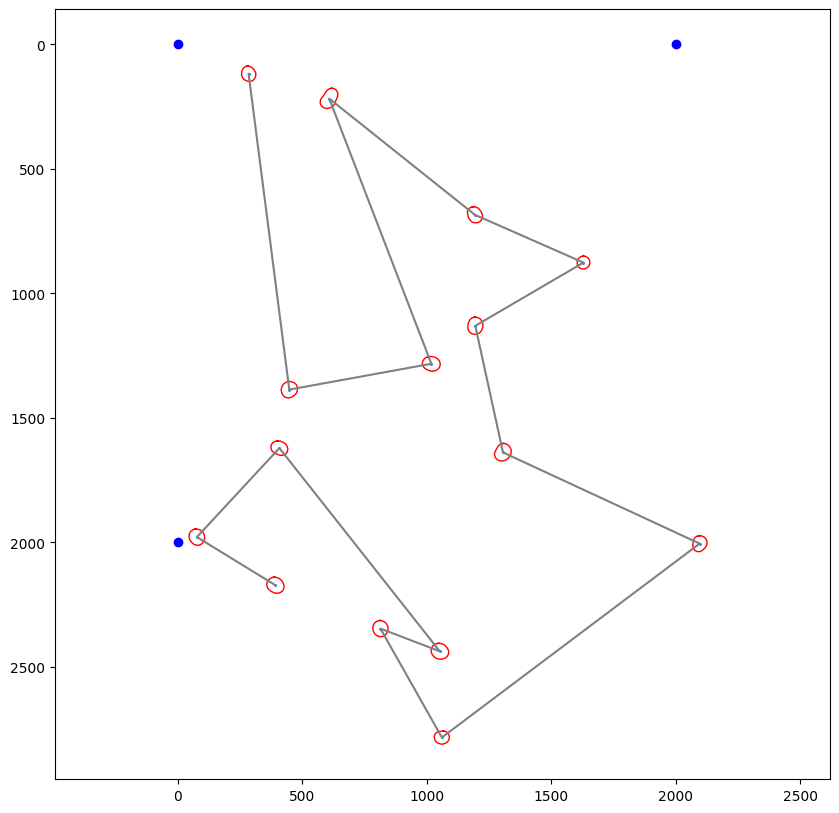

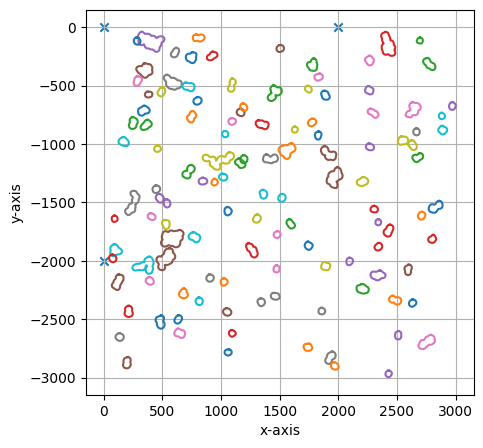

===== Collection Stats =====
Number of shapes: 121
Number of vertices: 2,912
Mean vertices: 24
Min vertices: 14
5% percentile vertices: 16
Median vertices: 20
95% percentile vertices: 50
Max vertices: 70
[0 0]
[      0 -200000]
[200000      0]
[01/06/2023 14:50:52] Saved output at /Users/sophia/Documents/GitHub/SPARCSpy/example_data/example_1/project/selection/bin1_bin2.xml


In [59]:
project.select(cells_to_select, calibration_marker, debug=True)